In [1]:
import numpy as np
from myplotstyle import plt, FIG_WIDTH_WIDE

from easyquery import Query, QueryMaker
import SAGA
from SAGA import ObjectCuts as C
from SAGA import HostCuts as H

from SAGA.utils import get_decals_viewer_image
from collections import Counter, defaultdict

In [2]:
print(SAGA.__version__)
saga = SAGA.QuickStart()

3.0.0
SAGA `shared_dir` set to /home/yymao/Dropbox/Work/SAGA
SAGA `local_dir`  set to /home/yymao/Documents/Work/Data/SAGA


In [3]:
base = H.paper3.filter(saga.object_catalog.load_combined_base_catalog())
nhosts = len(np.unique(base["HOSTID"]))
assert nhosts == 101

In [4]:
sats = C.is_sat.filter(base)
print(len(sats))
del base

378


In [5]:
hostlist = saga.host_catalog.load(include_stats=True, query="paper3")["HOSTID", "RA", "DEC", "sats_total", "sats_gold_silver", "COMMON_NAME"]
hostlist.sort(["sats_total", "sats_gold_silver"], reverse=True)

In [6]:
color_dict = dict(zip(hostlist["HOSTID"], plt.cm.rainbow_r(np.linspace(0, 1, len(hostlist)))))
np.savez("data/color_dict.npz", **color_dict)

In [7]:
counts = Counter(sats["HOSTID"])
print(len(counts), sum(counts.values()), max(counts.values()))

assert all(n == counts[h] for h, n in zip(hostlist["HOSTID"], hostlist["sats_total"]))
assert hostlist["sats_total"].sum() == len(sats)
assert np.count_nonzero(hostlist["sats_total"]) == len(np.unique(sats["HOSTID"]))

97 378 13


In [8]:
n_empty_hosts = Query("sats_total == 0").count(hostlist)
print(n_empty_hosts)

4


In [9]:
n_all = len(sats) + n_empty_hosts

k = 7 * np.sqrt(n_all / (8*7))
print(n_all, k)
for i in np.arange(int(k-5), int(k+6)):
    print(i, i - n_all % i)

382 18.28250529878222
13 8
14 10
15 8
16 2
17 9
18 14
19 17
20 18
21 17
22 14
23 9


In [10]:
include_host = False
ncols = 19

assert ncols >= max(counts.values()) + int(include_host)

d = defaultdict(list)
for host, count in zip(hostlist["HOSTID"], hostlist["sats_total"]):
    if not count:
        count = 1
    if include_host:
        count += 1
    d[count].append(host)

rows = []
for count, hosts in d.items():
    while hosts:
        row = [(hosts.pop(0), count)]
        space = ncols - count
        n_now = space
        while space and n_now:
            if n_now in d and d[n_now]:
                row.append((d[n_now].pop(0), n_now))
                space -= n_now
                n_now = space
            else:
                n_now -= 1
        rows.append(row)

nrows = len(rows)
print(nrows)

21


In [11]:
import os
from io import BytesIO
from PIL import Image

params_dict = dict(pixscale=0.2, size=200, layer="ls-dr9")
cache_dir_base = f"{saga._shared_dir}/Paper3"

def get_satellite_image(sat):
    fname = f"{sat['survey']}-{sat['OBJID']}.jpg"
    fpath = os.path.join(cache_dir_base, "satellite-images", fname)
    try:
        return Image.open(BytesIO(open(fpath, "rb").read()))
    except FileNotFoundError:
        params_dict["ra"] = sat["RA"]
        params_dict["dec"] = sat["DEC"]
        params_dict["pixscale"] = 0.2
        return get_decals_viewer_image(out=fpath, convert_to_data=True, **params_dict)


cache_dir = f"{cache_dir_base}/satellite-images"

def get_host_image(host):
    fname = f"{host['HOSTID']}.jpg"
    fpath = os.path.join(cache_dir_base, "host-images", fname)
    try:
        return Image.open(BytesIO(open(fpath, "rb").read()))
    except FileNotFoundError:
        params_dict["ra"] = host["RA"]
        params_dict["dec"] = host["DEC"]
        params_dict["pixscale"] = 1
        return get_decals_viewer_image(out=fpath, convert_to_data=True, **params_dict)

In [12]:
from matplotlib.patches import FancyBboxPatch, Polygon

def add_box(ax, x, y, width, height, color):
    p_bbox = FancyBboxPatch((x, y),
                        width, height,
                        boxstyle="round,pad=0,rounding_size=0.01",
                        ec=color, fc="none", zorder=10., linewidth=2,
                        )
    ax.add_patch(p_bbox)

def add_dogear(ax, pos, color, width=0.25):
    if pos == "left":
        xy = np.array([[0, 1-width], [0, 1], [width, 1]])
    else:
        xy = np.array([[1-width, 1], [1, 1], [1, 1-width]])

    tri = Polygon(xy, fc=color, zorder=10., linewidth=0, transform=ax.transAxes)
    ax.add_patch(tri)

/tmp/ipykernel_11797/490696535.py:107: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  plt.savefig("plots/saga-all-sats.pdf")


/tmp/ipykernel_11797/490696535.py:107: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  plt.savefig("plots/saga-all-sats.pdf")


/home/yymao/miniforge3/envs/mypy/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)


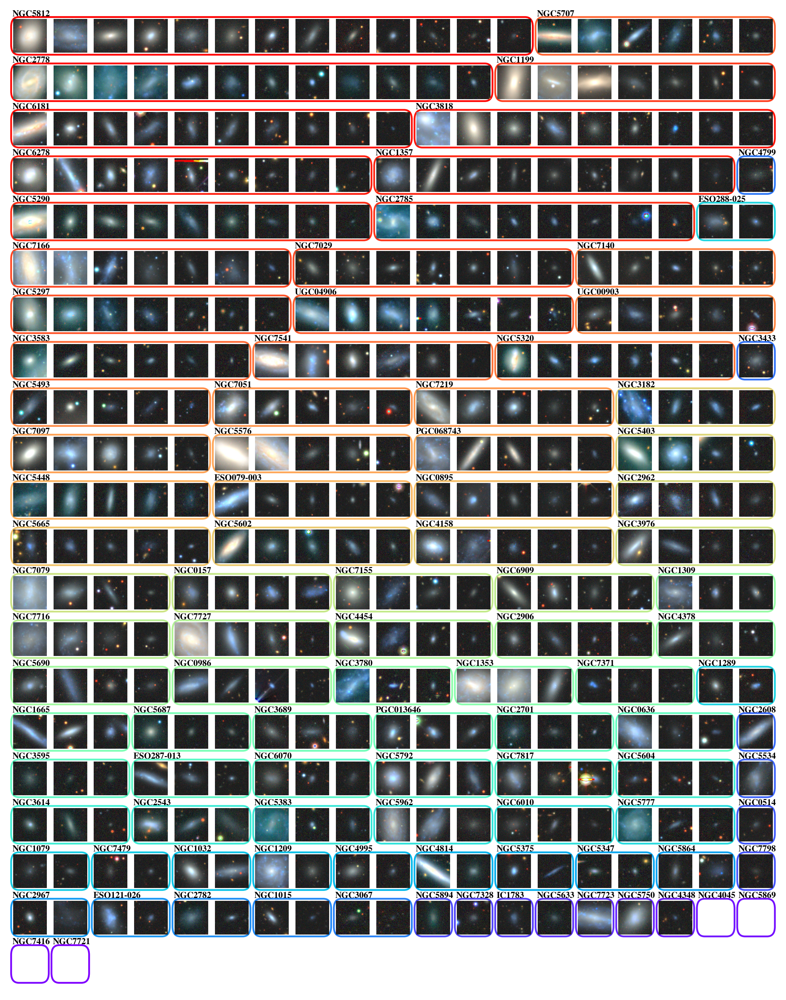

In [13]:
ADD_DOG_EARS = False
PRINT_HOST_NAME = True

xpad = 0.2
ypad = 0.38
lpad = 0.06

total_width = ncols + xpad * (ncols+1)
total_height = nrows + ypad * (nrows+1)

def calc_location(row, col):
    return xpad + col*(1+xpad), ypad + (nrows-row-1)*(1+ypad)

fig = plt.figure(figsize=(FIG_WIDTH_WIDE, FIG_WIDTH_WIDE*total_height/total_width), linewidth=0)

ax_f = plt.Axes(fig, [0,0,1,1], label="all")
ax_f.set_axis_off()
ax_f.set_facecolor("none")
fig.add_axes(ax_f)

for irow, row in enumerate(rows):
    icol = 0
    for host, count in row:
        host_entry = QueryMaker.equals("HOSTID", host).filter(hostlist)[0]
        print_host_name_this = PRINT_HOST_NAME

        if include_host:
            x, y = calc_location(irow, icol)
            x -= xpad * 0.5
            y -= xpad * 0.5
            width = 1 + xpad
            ax = plt.Axes(fig, [x/total_width, y/total_height, width/total_width, width/total_height], label=f"{irow}-{icol}")
            ax.set_axis_off()
            fig.add_axes(ax)
            img = get_host_image(host_entry)
            ax.imshow(img, aspect="auto")
            ax.text(5, 5, host_entry["COMMON_NAME"], fontweight="heavy", fontsize=7, va="top", color="white")
            icol += 1
            print_host_name_this = False

        sats_this = QueryMaker.equals("HOSTID", host).filter(sats)
        sats_this.sort("r_mag")
        box_start = calc_location(irow, icol)

        for sat in sats_this:
            x, y = calc_location(irow, icol)
            ax = plt.Axes(fig, [x/total_width, y/total_height, 1/total_width, 1/total_height], label=f"{irow}-{icol}")
            ax.set_axis_off()
            fig.add_axes(ax)
            img = get_satellite_image(sat)
            ax.imshow(img, aspect="auto")
            if sat["EW_Halpha"] < 2 and ADD_DOG_EARS:
                add_dogear(ax, "left", "C3")
            if sat["Mr"] >= -12.295 and ADD_DOG_EARS:
                add_dogear(ax, "right", "C9")
            if print_host_name_this:
                ax.text(-5, -ypad*50, sat["HOST_COMMON_NAME"], fontweight="heavy", fontsize=10)
                print_host_name_this = False
            icol += 1

        if len(sats_this) == 0:
            x, y = calc_location(irow, icol)
            ax = plt.Axes(fig, [x/total_width, y/total_height, 1/total_width, 1/total_height], label=f"{irow}-{icol}")
            ax.set_axis_off()
            fig.add_axes(ax)
            if print_host_name_this:
                ax.text(-5/200, 1+ypad*50/200, host_entry["COMMON_NAME"], fontweight="heavy", fontsize=10)
                print_host_name_this = False
            icol += 1

        if include_host:
            count -= 1

        x = box_start[0] - lpad
        y = box_start[1] - lpad
        dx = count + (count-1)*xpad + lpad*2
        dy = 1 + lpad*2
        add_box(ax_f, x/total_width, y/total_height, dx/total_width, dy/total_height, color=color_dict[host])


if ADD_DOG_EARS:
    icol += 5
    for text in ("Quenched", "Below\n$M_{r,o}$ limit"):
        x, y = calc_location(irow, icol)
        ax = plt.Axes(fig, [x/total_width, y/total_height, 1/total_width, 1/total_height], label=f"{irow}-{icol}")
        ax.set_axis_off()
        fig.add_axes(ax)
        ax.imshow([[0]], cmap="gray_r", vmin=-10, vmax=50)
        ax.text(0, 0, text, ha="center", va="center", fontsize=13)
        if text == "Quenched":
            add_dogear(ax, "left", "C3")
        else:
            add_dogear(ax, "right", "C9")
        icol += 1
    """
    x, y = calc_location(irow, icol)
    ax = plt.Axes(fig, [x/total_width, y/total_height, 1/total_width, 1/total_height], label=f"{irow}-{icol}")
    ax.set_axis_off()
    fig.add_axes(ax)
    ax.imshow([[0]], cmap="gray_r", vmin=-10, vmax=50)
    add_dogear(ax, "left", "C3")
    add_dogear(ax, "right", "C9")
    ax.text(-0.49, -0.2, "Quenched", ha="left", va="center", fontsize=11, color="C3", fontweight="bold")
    ax.text(0.49, 0.15, "↑\nBelow\n$M_r$ limit ", ha="right", va="center", fontsize=11, color="C9", fontweight="bold")
    """

plt.savefig("plots/saga-all-sats.pdf")

In [14]:
! gs -sDEVICE=pdfwrite -dCompatibilityLevel=1.4 -dPDFSETTINGS=/ebook -dNOPAUSE -dQUIET -dBATCH -sOutputFile="plots/saga-all-sats.compressed.pdf" "plots/saga-all-sats.pdf" && mv "plots/saga-all-sats.compressed.pdf" "plots/saga-all-sats.pdf"